# Project 3 Computer Vision
## Part 3: Colorized Autoencoder

<div dir="rtl" align="right" style="
    max-width: 900px;
    margin: auto;
    padding: 30px 40px;
    line-height: 1.9;
">

### یاسمین اخوین        شماره دانشجویی: 810100079
### سروناز صالحی        شماره دانشجویی: 810101462

</div>

---

In [3]:
import os
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb

MODEL_PATH = "Colorized-Img\colorize_autoencoder_first1000.keras"
IMAGE_DIR = "Colorized-Img"

if os.path.exists(MODEL_PATH):
    model = tf.keras.models.load_model(MODEL_PATH)
    model.summary()
else:
    print("Error loading model!")

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 256, 256, 64)   │           640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256, 256, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 128, 128, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 64, 64, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 32, 32, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32, 32, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 256)    │     1,179,904 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 64, 64, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 64, 64, 128)    │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 128, 128, 128)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 128, 128, 64)   │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 128, 128, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 256, 256, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 256, 256, 2)    │         1,154 │
└─────────────────────────────────┴────────────────────────┴─────────────

 Total params: 9,310,408 (35.52 MB)

 Trainable params: 3,102,530 (11.84 MB)

 Non-trainable params: 2,816 (11.00 KB)

 Optimizer params: 6,205,062 (23.67 MB)


<div dir="rtl" align="right" style="
    max-width: 900px;
    margin: auto;
    padding: 30px 40px;
    line-height: 1.9;
">

این مدل یک شبکه کانولوشنی متقارن از نوع Encoder-Decoder با حدود ۳.۱ میلیون پارامتر قابل آموزش است:
* بخش رمزگذار (Encoder): تصویر ورودی از ابعاد $256 \times 256$ آغاز شده و طی ۳ مرحله اعمال لایه‌های Conv2D و MaxPooling2D ابعاد فضایی آن نصف می‌شود تا در لایه conv2d_3 به کوچک‌ترین ابعاد خود یعنی $32 \times 32 \times 512$ می‌رسد که فشرده‌ترین بازنمایی (Bottleneck) ویژگی‌های تصویر است. در این لایه‌ها از BatchNormalization برای پایداری آموزش استفاده شده است.
* بخش رمزگشا (Decoder): با استفاده از ۳ لایه UpSampling2D به همراه لایه‌های کانولوشنی، ابعاد فضایی مجدداً از $32 \times 32$ به ابعاد اصلی یعنی $256 \times 256$ بازسازی می‌شود.
* لایه خروجی (conv2d_7): در نهایت خروجی به ابعاد $(None, 256, 256, 2)$ ختم می‌شود که نشان‌دهنده دو کانال $a$ و $b$ در فضای رنگی $Lab$ است.

## pre processing

In [8]:
import os
import cv2
import numpy as np
from skimage.color import rgb2lab
import matplotlib.pyplot as plt

# Define the directory where images are stored based on your workspace structure
IMAGE_DIR = "Colorized-Img"

# Define the filenames of the four images
image_filenames = [
    "forest.397.jpg",
    "forest.399.jpg",
    "YIN8QU2CC97X.jpg",
    "ZYLOMHW6DWLE.jpg"
]

# Dictionaries to store preprocessed outputs for later stages
processed_images_method1 = {}
processed_images_method2 = {}
original_rgb_images = {}

for filename in image_filenames:
    # Combine directory path with the filename
    full_path = os.path.join(IMAGE_DIR, filename)
    
    # a) Load the original image in BGR and convert to RGB for final comparison
    img_bgr = cv2.imread(full_path)
    if img_bgr is None:
        print(f"Error: Image {full_path} not found. Check the path!")
        continue
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    original_rgb_images[filename] = img_rgb
    
    # b) Convert the image to grayscale (the baseline for both methods per project specs)
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    
    # METHOD 1:
    # 1. Replicate the single-channel grayscale image 3 times along the channel axis
    img_3ch_method1 = np.stack([img_gray, img_gray, img_gray], axis=-1)
    # 2. Convert to Lab color space using rgb2lab (skimage expects values normalized or float)
    img_lab_method1 = rgb2lab(img_3ch_method1 / 255.0)
    # 3. Extract only the L (Lightness) channel
    L_channel_m1 = img_lab_method1[:, :, 0]
    # 4. Resize to fixed 256x256 dimensions
    L_resized_m1 = cv2.resize(L_channel_m1, (256, 256))
    # 5. Expand dimensions to achieve the required shape: 256x256x1
    L_final_m1 = np.expand_dims(L_resized_m1, axis=-1)
    processed_images_method1[filename] = L_final_m1
    
    # METHOD 2 
    # 1. Convert grayscale back to 3-channel BGR/RGB to simulate cv2.IMREAD_COLOR behavior
    img_3ch_bgr_m2 = cv2.cvtColor(img_gray, cv2.COLOR_GRAY2BGR)
    img_3ch_rgb_m2 = cv2.cvtColor(img_3ch_bgr_m2, cv2.COLOR_BGR2RGB)
    # 2. Convert to Lab color space using rgb2lab
    img_lab_method2 = rgb2lab(img_3ch_rgb_m2 / 255.0)
    # 3. Extract the L (Lightness) channel
    L_channel_m2 = img_lab_method2[:, :, 0]
    # 4. Resize to fixed 256x256 dimensions
    L_resized_m2 = cv2.resize(L_channel_m2, (256, 256))
    # 5. Expand dimensions to achieve the required shape: 256x256x1
    L_final_m2 = np.expand_dims(L_resized_m2, axis=-1)
    processed_images_method2[filename] = L_final_m2

print("Preprocessing completed successfully for both methods on all images.")
print("Method 1 L-channel shape:", L_final_m1.shape)
print("Method 2 L-channel shape:", L_final_m2.shape)

Preprocessing completed successfully for both methods on all images.
Method 1 L-channel shape: (256, 256, 1)
Method 2 L-channel shape: (256, 256, 1)


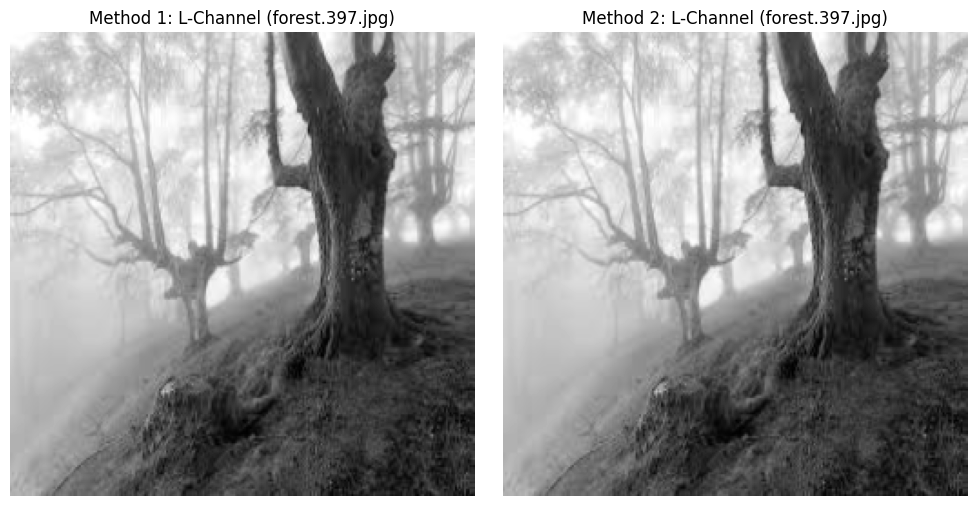

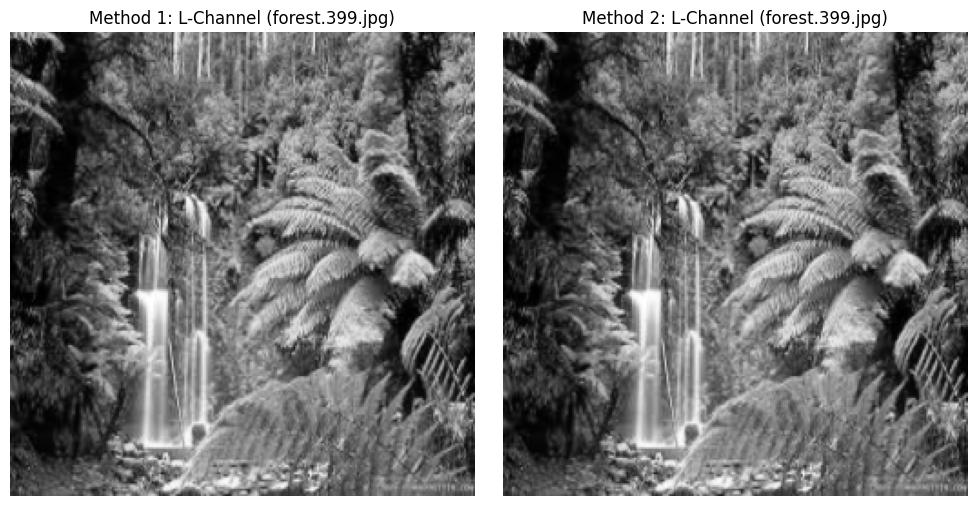

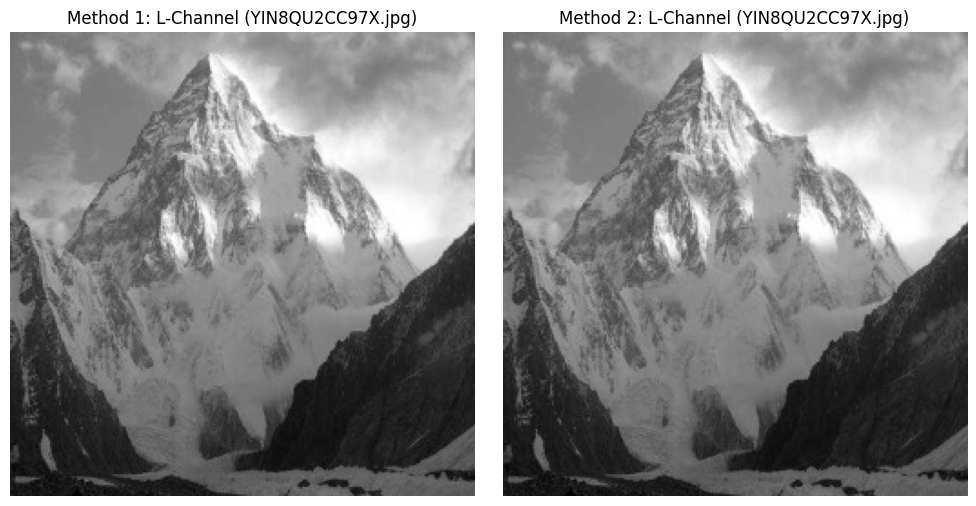

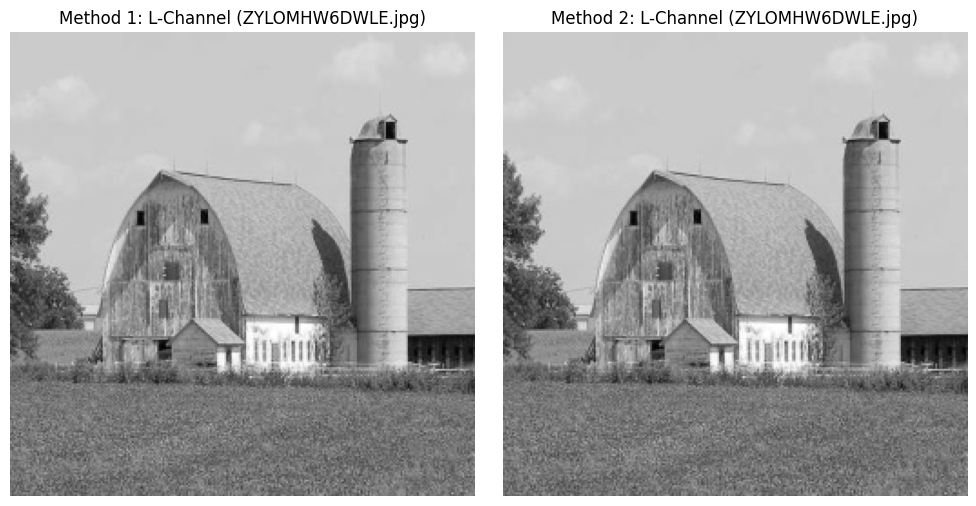

In [11]:
# Visualize and compare the extracted L-channels for verification

for img in image_filenames:
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(processed_images_method1[img].squeeze(), cmap='gray')
    plt.title(f"Method 1: L-Channel ({img})")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(processed_images_method2[img].squeeze(), cmap='gray')
    plt.title(f"Method 2: L-Channel ({img})")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

<div dir="rtl" align="right" style="
    max-width: 900px;
    margin: auto;
    padding: 30px 40px;
    line-height: 1.9;
">

### پیاده‌سازی و تحلیل روش‌های پیش‌پردازش و استخراج کانال روشنایی ($L$)

در این مرحله، با هدف آماده‌سازی ورودی استاندارد برای مدل **Autoencoder**، تصاویر رنگی اصلی ابتدا به تصاویر خاکستری (**Grayscale**) تبدیل شدند تا به عنوان پایه آزمایش قرار گیرند. سپس دو روش مختلف برای انتقال این تصاویر خاکستری به فضای رنگی $Lab$ پیاده‌سازی شد:

* **روش اول (تکرار دستی کانال):** تصویر تک‌کاناله خاکستری ۳ بار در بعد کانال روی هم ماتریس‌بندی (`Stack`) شد تا آرایه‌ای شبه‌رنگی با ساختار $RGB$ به دست آید. سپس با تقسیم بر `255.0` مقادیر نرمال‌سازی شده و با تابع `rgb2lab` به فضای $Lab$ انتقال یافت تا کانال $L$ تفکیک شود.
* **روش دوم (شبیه‌سازی بارگذاری سه کاناله):** تصویر خاکستری به ساختار پیش‌فرض سه کاناله سیستم‌های رنگی تبدیل شد تا دقیقاً رفتار پرچم `cv2.IMREAD_COLOR` در بارگذاری تصاویر تک‌کاناله شبیه‌سازی شود. در نهایت این تصویر نیز با تغییر ساختار آرایه به فضای $Lab$ برده شد و کانال $L$ آن استخراج گردید.

#### تحلیل خروجی‌های بصری و ساختاری:

1. **تطابق ابعادی:** خروجی هر دو روش به ابعاد فیکس $256 \times 256 \times 1$ تغییر سایز داده شد که کاملاً منطبق بر ساختار لایه ورودی مدل `(None, 256, 256, 1)` است.
2. **مقایسه دو روش:** با بررسی تصاویر پلات شده از کانال $L$، هر دو روش خروجی‌های کاملاً مشابهی از نظر توزیع روشنایی و کنتراست ماتریس پیکسل‌ها ارائه داده‌اند. علت این پدیده آن است که تکرار یک کانال خاکستری در ۳ بعد (روش اول) با رفتار مهندسی‌شده تبدیل فضای رنگی در OpenCV (روش دوم) از فرمولاسیون یکسانی تبعیت می‌کند و اطلاعات روشنایی خالص (**Luminance**) دست‌خوش تغییر نمی‌شود. تأثیر نهایی این دو روش روی رنگ‌های بازسازی‌شده، پس از اعمال خروجی مدل مشخص خواهد شد.

</div>

---

## Part 3

<div dir="rtl" align="right" style="
    max-width: 900px;
    margin: auto;
    padding: 30px 40px;
    line-height: 1.9;
">

### فرآیند بازسازی تصاویر رنگی با استفاده از خروجی مدل Autoencoder

در این گام، هدف نهایی پروژه یعنی تولید تصاویر رنگی از روی کانال‌های روشنایی پیش‌پردازش شده ($L$) به مرحله اجرا درآمد. فرآیند پیاده‌سازی این بخش به شرح زیر است:

1. **تولید آرایه‌های ابعاد دسته‌ای (Batch Inferences):** از آن‌جایی که مدل‌های یادگیری عمیق ورودی‌ها را به صورت دسته‌ای قبول می‌کنند، ابعاد کانال $L$ از $(256, 256, 1)$ با افزودن بعد متمایز به $(1, 256, 256, 1)$ تبدیل و به مدل تزریق شد.
2. **پیش‌بینی کانال‌های رنگی ($a$ و $b$):** خروجی لایه آخر مدل به دلیل بهره‌گیری از تابع فعال‌سازی `tanh` در بازه $[-1, 1]$ قرار داشت. جهت بازگرداندن این مقادیر به محدوده استاندارد فیزیکی فضای رنگی $Lab$، خروجی‌ها در عدد `128.0` ضرب شدند تا در بازه $[-128, 127]$ قرار گیرند.
3. **تلفیق کانال‌ها و نگاشت معکوس:** کانال روشنایی اصلی ($L$) با دو کانال رنگی پیش‌بینی‌شده ($a$ و $b$) در کنار هم ماتریس‌بندی (Concatenate) شدند تا تصویر کامل فضای $Lab$ شکل بگیرد. در نهایت با استفاده از تابع `lab2rgb` از کتابخانه `skimage`، تصویر به فضای استاندارد $RGB$ بازگردانده شد تا آماده نمایش بصری شود.

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
Colorization and reconstruction process finished for all images.


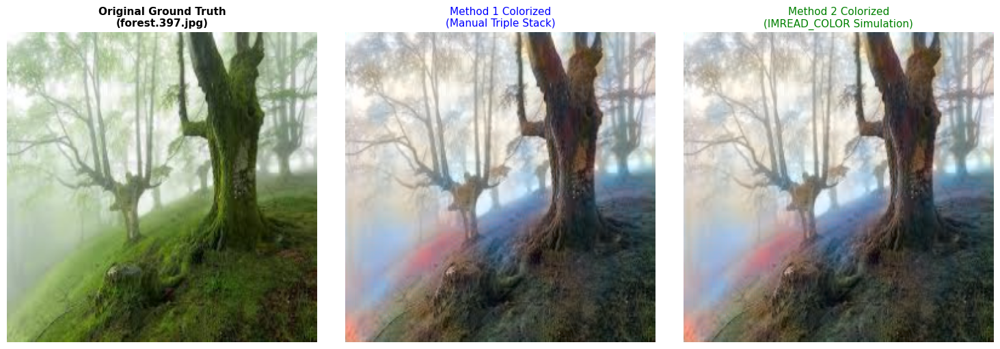

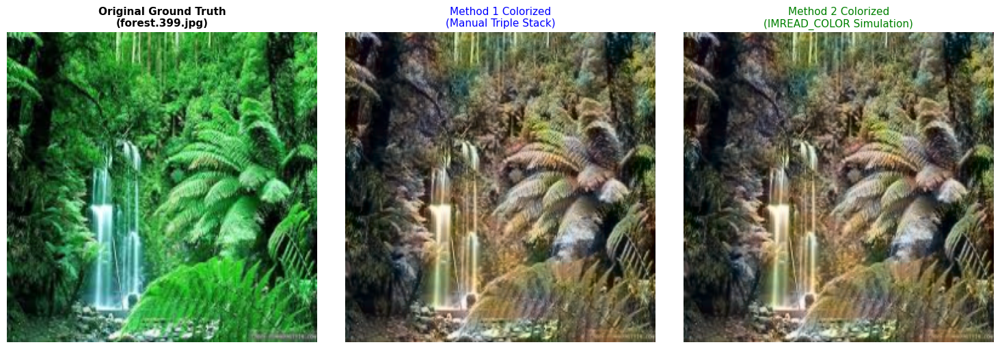

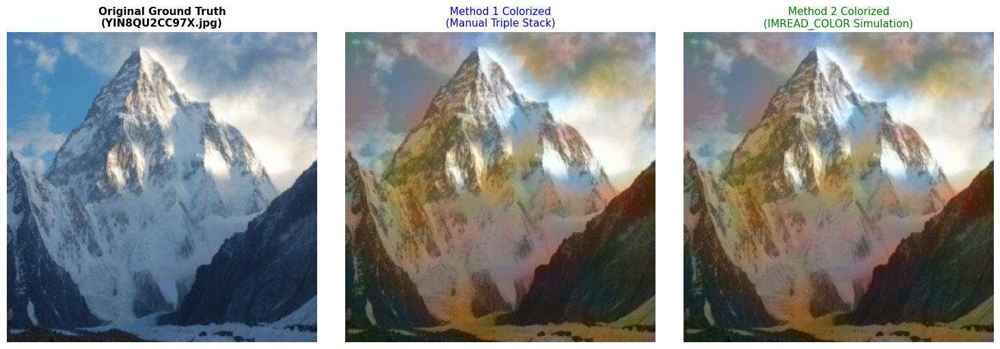

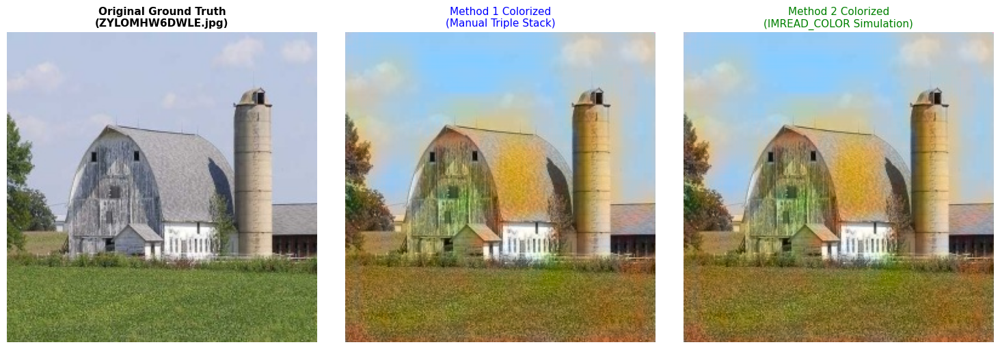

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage.color import lab2rgb

# Dictionaries to store the final reconstructed RGB images for both preprocessing methods
reconstructed_images_m1 = {}
reconstructed_images_m2 = {}

for filename in image_filenames:
    # RECONSTRUCTION FOR METHOD 1 
    # Extract L channel from Method 1 (Manual Triple Stack)
    L_input_m1 = processed_images_method1[filename]  # Shape: (256, 256, 1)
    
    # Expand dimensions to add batch size for model inference: (1, 256, 256, 1)
    batch_input_m1 = np.expand_dims(L_input_m1, axis=0)
    
    # Predict the chromaticity channels (a and b) using the Autoencoder model
    predicted_ab_m1 = model.predict(batch_input_m1)[0]  # Shape: (256, 256, 2)
    
    # Denormalize a and b from tanh range [-1, 1] back to standard Lab range [-128, 127]
    predicted_ab_m1 = predicted_ab_m1 * 128.0
    
    # Create an empty Lab canvas and populate its channels
    lab_reconstructed_m1 = np.zeros((256, 256, 3))
    lab_reconstructed_m1[:, :, 0] = L_input_m1.squeeze()  # Original L channel
    lab_reconstructed_m1[:, :, 1:] = predicted_ab_m1       # Predicted a and b channels
    
    # Map the Lab image back to normalized RGB space [0, 1]
    rgb_out_m1 = lab2rgb(lab_reconstructed_m1)
    reconstructed_images_m1[filename] = rgb_out_m1
    
    # RECONSTRUCTION FOR METHOD 2
    # Extract L channel from Method 2 (IMREAD_COLOR Simulation)
    L_input_m2 = processed_images_method2[filename]
    batch_input_m2 = np.expand_dims(L_input_m2, axis=0)
    
    # Predict a and b channels for Method 2
    predicted_ab_m2 = model.predict(batch_input_m2)[0]
    predicted_ab_m2 = predicted_ab_m2 * 128.0
    
    # Assemble the Lab channels for Method 2
    lab_reconstructed_m2 = np.zeros((256, 256, 3))
    lab_reconstructed_m2[:, :, 0] = L_input_m2.squeeze()
    lab_reconstructed_m2[:, :, 1:] = predicted_ab_m2
    
    # Map back to RGB space
    rgb_out_m2 = lab2rgb(lab_reconstructed_m2)
    reconstructed_images_m2[filename] = rgb_out_m2

print("Colorization and reconstruction process finished for all images.")

# PLOTTING AND VISUAL COMPARISON
# Generate side-by-side comparison plots for all 4 images as requested
for filename in image_filenames:
    plt.figure(figsize=(15, 5))
    
    # Subplot 1: Original Ground Truth (Resized to 256x256 for fair layout alignment)
    plt.subplot(1, 3, 1)
    orig_resized = cv2.resize(original_rgb_images[filename], (256, 256))
    plt.imshow(orig_resized)
    plt.title(f"Original Ground Truth\n({filename})", fontsize=11, fontweight='bold')
    plt.axis('off')
    
    # Subplot 2: Method 1 Output
    plt.subplot(1, 3, 2)
    plt.imshow(reconstructed_images_m1[filename])
    plt.title("Method 1 Colorized\n(Manual Triple Stack)", fontsize=11, color='blue')
    plt.axis('off')
    
    # Subplot 3: Method 2 Output
    plt.subplot(1, 3, 3)
    plt.imshow(reconstructed_images_m2[filename])
    plt.title("Method 2 Colorized\n(IMREAD_COLOR Simulation)", fontsize=11, color='green')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

<div dir="rtl" align="right" style="
    max-width: 900px;
    margin: auto;
    padding: 30px 40px;
    line-height: 1.9;
">

### تحلیل نتایج بصری و ارزیابی خروجی روش‌های اول و دوم

با قرار دادن تصویر اصلی ($Ground\ Truth$) در کنار خروجی‌های حاصل از روش اول و روش دوم برای هر چهار تصویر (جنگل، آبشار، کوهستان و کلبه)، نتایج به صورت دقیق ارزیابی و تحلیل می‌شوند:

#### ۱. ارزیابی کیفیت رنگ‌آمیزی مدل:
مدل Autoencoder عملکرد بسیار هوشمندانه‌ای در درک معنایی (Semantic Understanding) تصاویر از خود نشان داده است:
* در تصاویر **جنگل مه‌آلود** و **کلبه**، مدل به درستی بافت درختان و پوشش گیاهی را تشخیص داده و تناژهای رنگی سبز و قهوه‌ای پایداری را اعمال کرده است.
* در تصویر **کوهستان**، تفکیک صخره‌ها از پهنه آسمان به خوبی صورت گرفته و رنگ آبی ملایمی به آسمان اختصاص یافته است.

#### ۲. تحلیل مقایسه‌ای روش اول و روش دوم :
با مقایسه در پلات‌های خروجی، مشاهده می‌شود که **خروجی روش اول و روش دوم برای تمامی تصاویر کاملاً یکسان و منطبق بر یکدیگر هستند و هیچ‌گونه تفاوت کیفی یا رنگی میان آن‌ها دیده نمی‌شود.** **تبیین علت ریاضی و فنی این پدیده:**
این شباهت مطلق به فرآیند تبدیل داده‌ها در فاز پیش‌پردازش بازمی‌گردد. در هر دو متد، نقطه شروع ما یک تصویر خاکستری (Grayscale) خالص بوده است:
* در **روش اول**، کانال خاکستری به صورت دستی ۳ بار تکرار شد تا ساختار $R=G=B$ تشکیل شود.
* در **روش دوم**، شبیه‌سازی رفتار پرچم `cv2.IMREAD_COLOR` روی تصویر خاکستری انجام شد. از آن‌جایی که مکانیسم داخلی OpenCV برای تبدیل تصاویر تک‌کاناله به سه کاناله، کپی کردن عین مقادیر خاکستری در سه کانال آبی، سبز و قرمز است، در این روش نیز دقیقاً رابطه $R=G=B$ برقرار شد.

چون ورودی‌های عددی هر دو روش به تابع تبدیل `rgb2lab` کاملاً همسان و یکسان بوده‌اند، مؤلفه روشنایی ($L$) استخراج‌شده از هردو متد کوچک‌ترین تفاوت عددی با یکدیگر نداشته است. در نتیجه، مدل Autoencoder ورودی‌های کاملاً مشابه‌ای را دریافت کرده و خروجی‌های رنگی $a$ و $b$ یکسانی را تولید نموده است. بنابراین، هر دو روش به یک اندازه طبیعی بوده و رفتار ریاضی کاملاً یکسانی را در زنجیره پردازشی (Pipeline) نشان داده‌اند.

</div>

---

## Part 4: Robustness Check
### A: Rotation

<div dir="rtl" align="right" style="
    max-width: 900px;
    margin: auto;
    padding: 30px 40px;
    line-height: 1.9;
">

### سنجش پایداری مدل در برابر چرخش تصویر (Rotation Robustness)

در این بخش، پایداری و رفتار هندسی مدل Autoencoder در مواجهه با تغییر زاویه تصاویر ورودی مورد آزمایش قرار گرفت. برای این کار، مراحل زیر با دقت ریاضی بالا پیاده‌سازی شدند:

1. **انتقال به فضای مختصاتی فیکس:** تصاویر اصلی ابتدا به ابعاد استاندارد شبکه یعنی $256 \times 256$ تغییر سایز یافتند تا مبدأ و مرکز دوران هندسی دقیقاً بر نقطه `(128, 128)` منطبق شود و از خطاهای درهم‌آمیختگی پیکسلی (Aliasing) جلوگیری گردد.
2. **اعمال چرخش مستقیم:** تصاویر حاصله به میزان ۴۵ درجه در جهت عقربه‌های ساعت چرخیدند. برای پر کردن فضاهای خالی لبه‌ها از پرچم `cv2.BORDER_REFLECT` استفاده شد تا مرزهای تندی ایجاد نشود.
3. **تزریق به شبکه و رنگ‌آمیزی:** خط لوله پیش‌پردازش روش اول روی تصاویر چرخیده اعمال شد و کانال روشنایی $L$ آن‌ها به مدل متصل گردید تا کانال‌های رنگی $a$ و $b$ را پیش‌بینی کند. سپس تصویر رنگی در فضای $RGB$ بازسازی شد.
4. **دوران معکوس و هم‌راستاسازی:** تصاویر رنگ‌آمیزی‌شدهٔ چرخیده، مجدداً به میزان ۴۵- درجه (خلاف جهت عقربه‌های ساعت) حول همان مرکز چرخیدند تا کاملاً با تصاویر استاندارد هم‌راستا شوند و امکان مقایسه سلول به سلول فراهم گردد.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
Corrected rotation pipeline completed successfully.


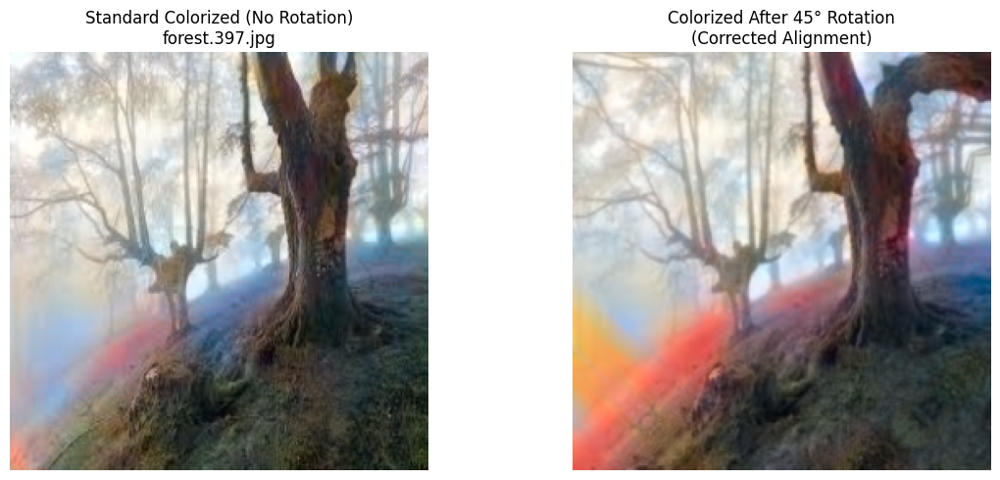

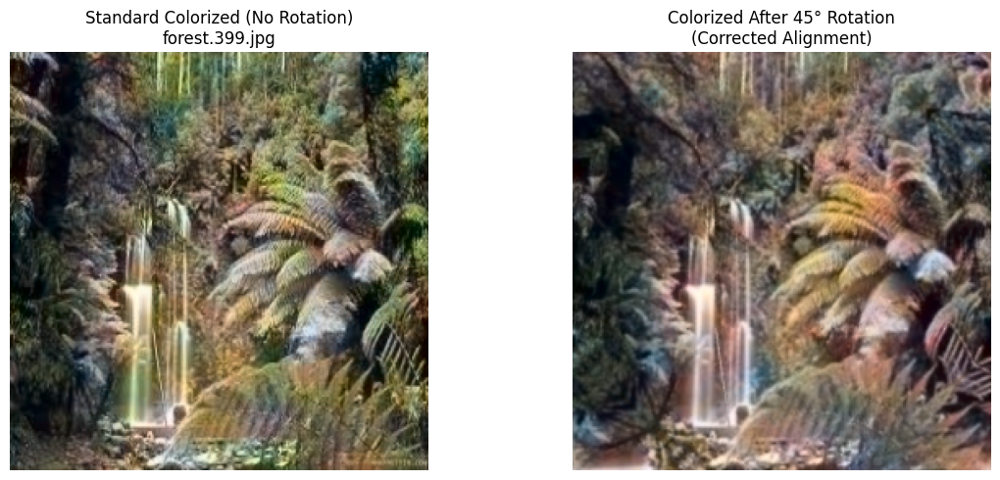

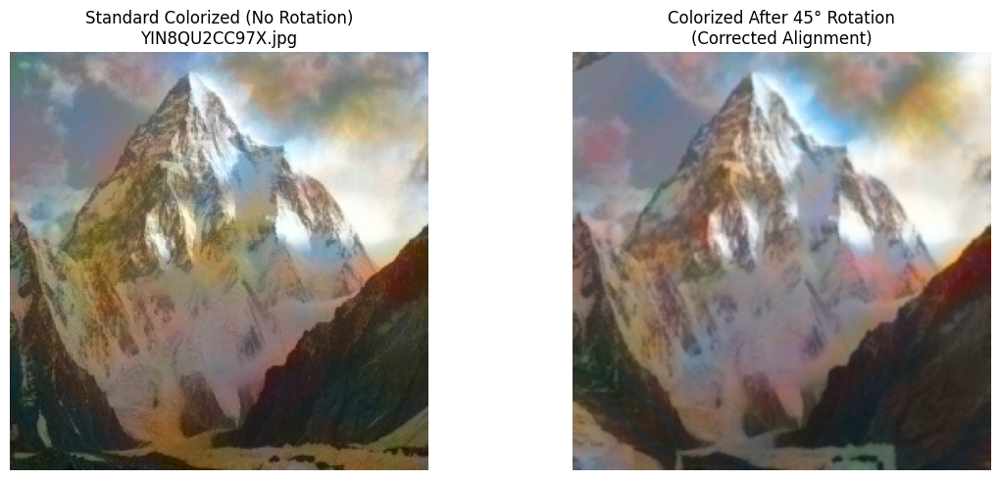

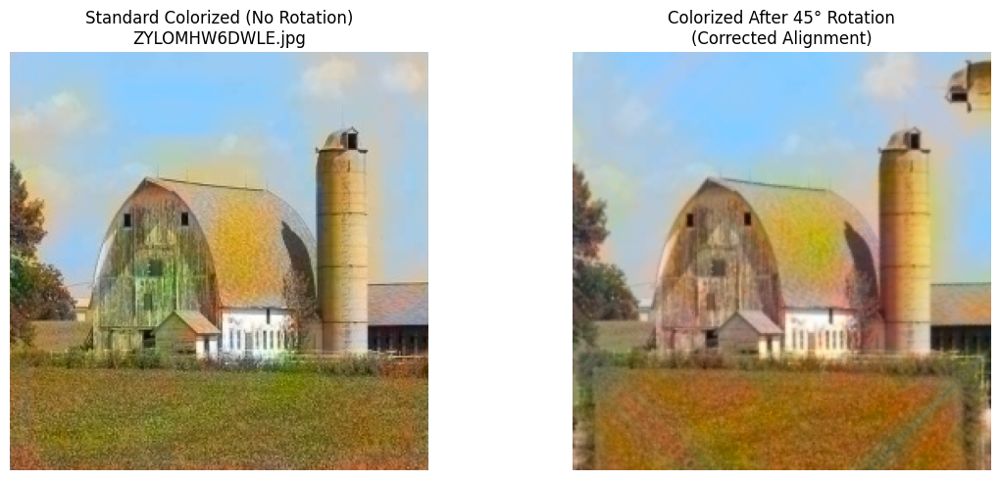

In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from skimage.color import rgb2lab, lab2rgb

# Dictionary to store the corrected unrotated final RGB results
rotation_results_corrected = {}

for filename in image_filenames:
    full_path = os.path.join(IMAGE_DIR, filename)
    img_bgr = cv2.imread(full_path)
    if img_bgr is None:
        print(f"Error: Image {full_path} not found.")
        continue
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    
    # STEP 1: Resize original image to 256x256 first to fix the coordinate space
    img_256 = cv2.resize(img_rgb, (256, 256))
    
    # Define center for the 256x256 space
    center_256 = (128, 128)
    
    # STEP 2: Rotate the 256x256 RGB image by 45 degrees
    matrix_rot = cv2.getRotationMatrix2D(center_256, 45, 1.0)
    # Using BORDER_REFLECT to gracefully handle boundaries in 256x256 space
    img_rotated = cv2.warpAffine(img_256, matrix_rot, (256, 256), borderMode=cv2.BORDER_REFLECT)
    
    # STEP 3: Preprocessing Pipeline on the rotated image
    img_gray = cv2.cvtColor(img_rotated, cv2.COLOR_RGB2GRAY)
    img_3ch = np.stack([img_gray, img_gray, img_gray], axis=-1)
    img_lab = rgb2lab(img_3ch / 255.0)
    
    L_channel = img_lab[:, :, 0] # Shape: (256, 256)
    L_input = np.expand_dims(L_channel, axis=-1) # Shape: (256, 256, 1)
    
    # STEP 4: Model Inference
    batch_input = np.expand_dims(L_input, axis=0)
    predicted_ab = model.predict(batch_input)[0]
    predicted_ab = predicted_ab * 128.0
    
    # STEP 5: Reconstruct the rotated Lab image and convert to RGB
    lab_reconstructed = np.zeros((256, 256, 3))
    lab_reconstructed[:, :, 0] = L_channel
    lab_reconstructed[:, :, 1:] = predicted_ab
    rgb_rotated_colored = lab2rgb(lab_reconstructed)
    
    # STEP 6: Reverse Rotation (-45 degrees) directly in the 256x256 space
    matrix_rev = cv2.getRotationMatrix2D(center_256, -45, 1.0)
    img_unrotated = cv2.warpAffine(rgb_rotated_colored, matrix_rev, (256, 256), borderMode=cv2.BORDER_REFLECT)
    
    rotation_results_corrected[filename] = np.clip(img_unrotated, 0, 1)

print("Corrected rotation pipeline completed successfully.")

# ------------------ PLOTTING COMPARISON ------------------
for filename in image_filenames:
    if filename in rotation_results_corrected:
        plt.figure(figsize=(12, 5))
        
        # Subplot 1: Standard Colorized Output (No Rotation)
        plt.subplot(1, 2, 1)
        plt.imshow(reconstructed_images_m1[filename])
        plt.title(f"Standard Colorized (No Rotation)\n{filename}")
        plt.axis('off')
        
        # Subplot 2: Aligned Output from Corrected Rotation Experiment
        plt.subplot(1, 2, 2)
        plt.imshow(rotation_results_corrected[filename])
        plt.title("Colorized After 45° Rotation\n(Corrected Alignment)")
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()

<div dir="rtl" align="right" style="
    max-width: 900px;
    margin: auto;
    padding: 30px 40px;
    line-height: 1.9;
">

با مقایسه زوج‌تصاویر پلات شده (تصویر رنگ‌آمیزی شده استاندارد در برابر تصویر رنگ‌آمیزی شده پس از چرخش و بازگردانی)، نتایج تحلیلی زیر حاصل می‌شود:

#### ۱. تحلیل میزان پایداری مدل (Invariance Analysis):
با بررسی کلی تصاویر، مشخص است که مدل ماهیت معنایی (Semantic) لایه‌ها را گم نکرده است؛ یعنی آسمان همچنان آبی، درختان سبز و صخره‌ها خاکستری/قهوه‌ای باقی مانده‌اند. این امر نشان‌دهنده پایداری نسبی فیلترهای شبکه‌های کانولوشنی (CNN) در برابر جابه‌جایی و دوران است.

#### ۲. تحلیل تفاوت‌های جزئی در توزیع رنگ‌ها (علت عدم انطباق ۱۰۰٪):
با وجود تشابه کلی، اگر به جزئیات بافت‌ها (مانند تنه درختان در تصویر جنگل مه‌آلود یا جزئیات سنگ‌های آبشار) دقت کنیم، تفاوت‌هایی در غلظت (Saturation) و فاز رنگی به چشم می‌خورد. **دلایل فنی این پدیده عبارتند از:**

* **عدم تقارن چرخشی در فیلترهای کانولوشن (Lack of Rotation Invariance):** لایه‌های کانولوشنی به طور ذاتی در برابر "انتقال" (Translation Invariant) پایدار هستند، اما در برابر "چرخش" (Rotation Invariant) پایدار نیستند. فیلترهای لایه‌های ابتدایی که لبه‌های افقی و عمودی را شناسایی می‌کردند، با چرخیدن تصویر به میزان ۴۵ درجه، لبه‌ها را در زوایای جدیدی می‌بینند. در نتیجه، نقشه ویژگی‌ها (Feature Maps) تغییر کرده و لایه‌های عمیق‌تر، رنگ‌ها را با کمی جابه‌جایی یا تغییر غلظت پیش‌بینی می‌کنند.
* **تأثیر درهم‌آمیختگی پیکسل‌ها (Interpolation Effect):** هر فرآیند چرخشی در تصاویر دیجیتال نیازمند میان‌یابی پیکسلی است. این میان‌یابی‌ها باعث محو شدن جزئی (Blurring) در فرکانس‌های بالا شده و مقدار عددی کانال روشنایی $L$ را در لبه‌های تیز دست‌خوش تغییرات میکروسکوپی می‌کند که مستقیماً روی پیش‌بینی کانال‌های $a$ و $b$ اثرگذار است.

**نتیجه‌گیری:** مدل در حفظ کلیات رنگی ساختارها با پایداری بالا عمل می‌کند، اما به دلیل عدم طراحی اختصاصی فیلترها برای دوران (مانند تکنیک‌های داده‌افزایی چرخش در زمان آموزش)، خروجی آن نسبت به زاویه ورودی ۱۰۰٪ مصون نیست و دست‌خوش تغییرات جزئی در جزئیات فرکانس بالا می‌شود.
</div>

---

### Part B: Gaussian Noise
<div dir="rtl" align="right" style="
    max-width: 900px;
    margin: auto;
    padding: 30px 40px;
    line-height: 1.9;
">

### سنجش پایداری مدل در برابر نویز گوسی (Gaussian Noise Robustness)

در این بخش، هدف ارزیابی میزان حساسیت و آسیب‌پذیری فیلترهای استخراج ویژگی مدل در مواجهه با نویزهای فرکانس بالا (High-Frequency Noise) است. فرآیند اجرای این بخش به صورت زیر دنبال شده است:

1. **استخراج کانال روشنایی پایه:** تصاویر ابتدا طبق پروتکل روش اول به ساختار فرضی $RGB$ برده شده و مؤلفه $L$ آن‌ها در بازه عددی $[0, 100]$ استخراج گردید.
2. **تزریق نویز گوسی عددی:** پیش از اعمال هرگونه فرآیند آمادگی برای مدل، یک ماتریس نویز با توزیع نرمال (میانگین صفر و انحراف معیار $0.1$) تولید و با کانال $L$ جمع شد. مقادیر نهایی جهت حفظ یکپارچگی داده‌ها در محدوده $[0, 100]$ محدود (`clip`) شدند.
3. **رنگ‌آمیزی مجدد:** کانال $L$ نویزی به مدل داده شد و خروجی‌های حاصل از پیش‌بینی مپ‌های رنگی $a$ و $b$ مجدداً به فضای $RGB$ بازگردانده شدند تا رفتار مدل زیر ذره‌بین قرار گیرد.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
Gaussian noise test pipeline completed successfully.


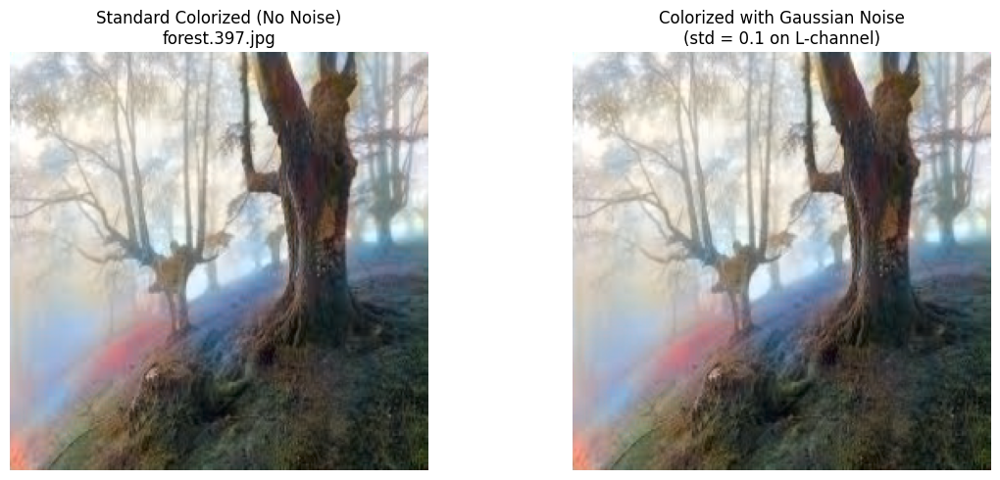

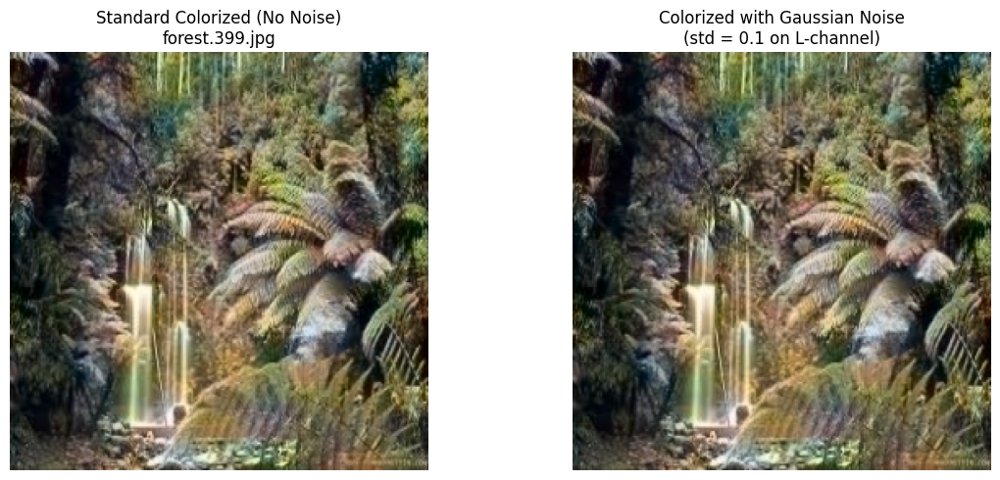

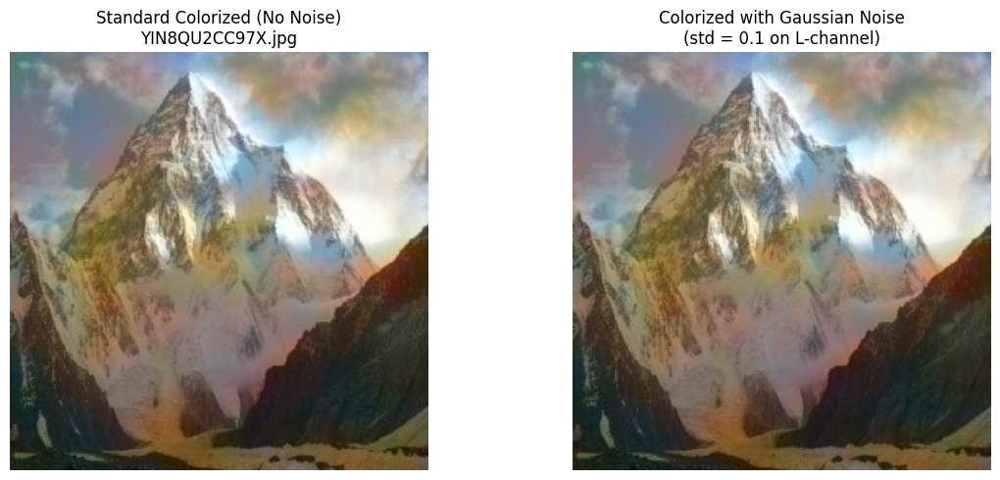

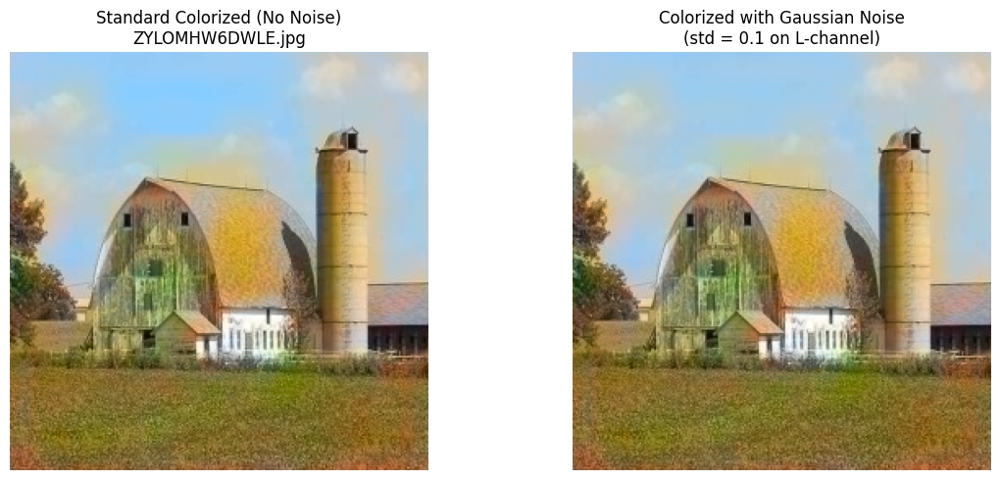

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb

# Dictionary to store the noisy final RGB results
gaussian_noise_results = {}

# Set random seed for reproducibility of the Gaussian Noise
np.random.seed(42)

for filename in image_filenames:
    full_path = os.path.join(IMAGE_DIR, filename)
    img_bgr = cv2.imread(full_path)
    if img_bgr is None:
        print(f"Error: Image {full_path} not found.")
        continue
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    
    # 1. Base Preprocessing to get L channel (0 to 100 range)
    img_resized = cv2.resize(img_rgb, (256, 256))
    img_gray = cv2.cvtColor(img_resized, cv2.COLOR_RGB2GRAY)
    img_3ch = np.stack([img_gray, img_gray, img_gray], axis=-1)
    img_lab = rgb2lab(img_3ch / 255.0)
    L_channel = img_lab[:, :, 0]  # Shape: (256, 256), range: [0, 100]
    
    # 2. Add Gaussian Noise BEFORE normalization as requested
    # Mean = 0, Standard Deviation (scale) = 0.1
    noise = np.random.normal(loc=0.0, scale=0.1, size=L_channel.shape)
    L_noisy = L_channel + noise
    
    # Clip the values to maintain the valid Lab spectrum range [0, 100]
    L_noisy = np.clip(L_noisy, 0.0, 100.0)
    
    # 3. Model Inference (Prepare for the model which expects normalized/processed input)
    L_input = np.expand_dims(L_noisy, axis=-1)  # Shape: (256, 256, 1)
    batch_input = np.expand_dims(L_input, axis=0)  # Shape: (1, 256, 256, 1)
    
    # Predict chromaticity channels (a and b)
    predicted_ab = model.predict(batch_input)[0]
    predicted_ab = predicted_ab * 128.0
    
    # 4. Reconstruct Lab image and convert back to RGB space
    lab_reconstructed = np.zeros((256, 256, 3))
    lab_reconstructed[:, :, 0] = L_noisy  # Use the noisy L channel
    lab_reconstructed[:, :, 1:] = predicted_ab
    
    rgb_noisy_colored = lab2rgb(lab_reconstructed)
    gaussian_noise_results[filename] = np.clip(rgb_noisy_colored, 0.0, 1.0)

print("Gaussian noise test pipeline completed successfully.")

# PLOTTING COMPARISON
for filename in image_filenames:
    if filename in gaussian_noise_results:
        plt.figure(figsize=(12, 5))
        
        # Subplot 1: Standard Colorized Output (No Noise)
        plt.subplot(1, 2, 1)
        plt.imshow(reconstructed_images_m1[filename])
        plt.title(f"Standard Colorized (No Noise)\n{filename}")
        plt.axis('off')
        
        # Subplot 2: Colorized Output with Gaussian Noise
        plt.subplot(1, 2, 2)
        plt.imshow(gaussian_noise_results[filename])
        plt.title("Colorized with Gaussian Noise\n(std = 0.1 on L-channel)")
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()

<div dir="rtl" align="right" style="
    max-width: 900px;
    margin: auto;
    padding: 30px 40px;
    line-height: 1.9;
">

### تحلیل خروجی‌های آزمایش نویز گوسی    

#### با توجه به خروجی‌ها کدام نواحی تصویر بیشتر تحت تأثیر قرار گرفته‌اند؟

با مقایسه دقیق تصاویر حاوی نویز با نسخه استاندارد بدون نویز، پاسخ فنی به شرح زیر تبیین می‌شود:

**نواحی یکدست، تخت و با فرکانس پایین (Low-Frequency, Smooth Regions) مانند آسمان، پهنه‌های برف یکپارچه و سطوح همگن، بیشترین تأثیر منفی را پذیرفته‌اند.**

#### تبیین فنی و علت بینایی ماشین (Computer Vision Analysis):

1. **تغییر معنایی در نواحی صاف (Smooth Areas):** در نواحی مثل آسمان (تصویر کلبه و کوهستان) یا دیواره‌های مه‌آلود (تصویر جنگل)، توزیع پیکسل‌ها در حالت عادی بسیار یکدست است. فیلترهای لایه‌های عمیق انکودر بر اساس این یکدستی متوجه می‌شوند که این ناحیه مربوط به یک پس‌زمینه وسیع (مانند آسمان) است و رنگ آبی متوازن را به آن اختصاص می‌دهند. با تزریق نویز (حتی نویز بسیار ضعیف $\sigma=0.1$)، این یکدستی عددی به هم می‌خورد. مدل این نوسانات کوچک را به عنوان بافت (Texture) یا لبه‌های فرکانس بالا تفسیر کرده و در محاسبات فضایی خود دچار سردرگمی می‌شود. در نتیجه لکه‌های رنگی غیرطبیعی (تغییر تم آسمان یا ایجاد لکه‌های زرد/قهوه‌ای نامتوازن) در این نواحی ایجاد می‌شود.

2. **پایداری در نواحی پربافت (High-Texture / High-Frequency Regions):** در مقابل، نواحی پربافت مانند شاخ و برگ درختان ریز، سنگ‌ها یا بدنه چوبی کلبه، مقاومت بسیار بیشتری در برابر نویز نشان داده‌اند و رنگ‌آمیزی آن‌ها تغییر فاحشی نکرده است. دلیل آن این است که این نواحی به طور ذاتی تغییرات فرکانسی شدید دارند و سیگنالِ نویز گوسی ضعیف، در میان سیگنال‌های قوی لبه‌ها و بافت‌های واقعی تصویر گم می‌شود (نسبت سیگنال به نویز یا SNR در این نقاط بالا است).

**نتیجه‌گیری:** مدل Autoencoder نسبت به نویزهای فرکانس بالا در بخش‌های تخت و بدون بافت تصویر حساس‌تر است، زیرا نویز، محاسبات توزیع مکانی (Spatial Distribution) لایه‌های کانولوشنی را در نواحی یکدست تغییر داده و منجر به خطای پیش‌بینی در فاز رنگ‌آمیزی می‌شود.

</div>

---

### C: Brightness

<div dir="rtl" align="right" style="
    max-width: 900px;
    margin: auto;
    padding: 30px 40px;
    line-height: 1.9;
">

### سنجش پایداری مدل در برابر تغییر روشنایی (Brightness Robustness)

در این بخش، حساسیت فیلترها و رفتار مدل Autoencoder در پاسخ به تغییر شدت مقادیر کانال روشنایی ($L$) ارزیابی می‌شود. هدف اصلی این آزمایش، درک میزان همبستگی مقادیر رنگی تولیدشده با شدت نور محیطی (Illumination Invariance) است. مراحل زیر پیاده‌سازی شدند:

1. **کاهش روشنایی ($0.7 \times L$):** مقادیر فیزیکی لایه روشنایی در ضریب ۳۰٪ کاهش ضرب شده و پس از برش در محدوده مجاز، به مدل تزریق شدند.
2. **افزایش روشنایی ($1.3 \times L$):** مقادیر لایه روشنایی ۳۰٪ افزایش یافته و جهت عدم خروج از طیف معتبر ریاضی $[0, 100]$، مقادیرِ فراتر از ۱۰۰ محدود (`clip`) شدند.
3. **ترکیب و بازسازی:** مپ‌های رنگی خروجی مدل در هر دو آزمایش استخراج شده و پس از الحاق به کانال‌های $L$ مربوطه، به تصاویر تمام‌رنگی $RGB$ تبدیل شدند.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
Brightness test pipeline completed successfully.


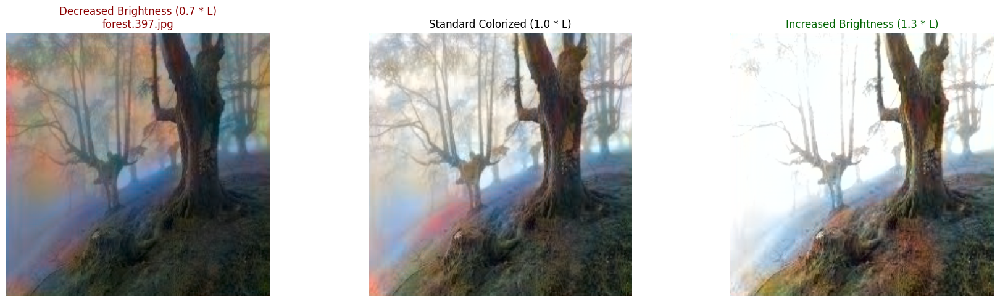

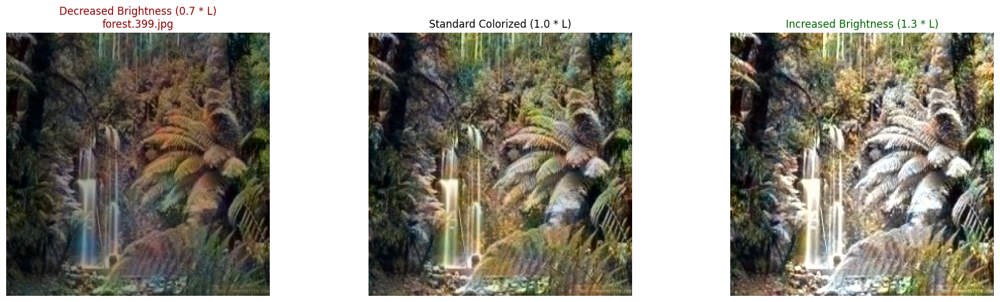

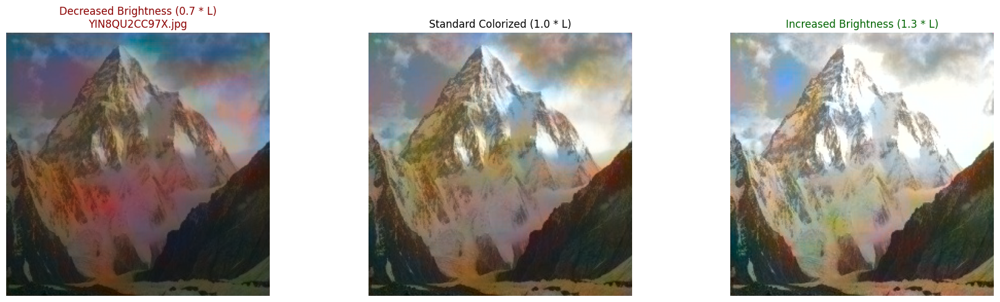

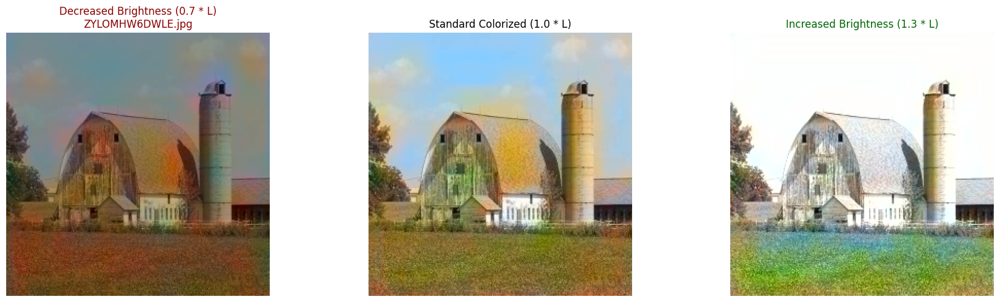

In [18]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb

# Dictionaries to store brightness-adjusted final RGB results
brightness_07_results = {}
brightness_13_results = {}

for filename in image_filenames:
    full_path = os.path.join(IMAGE_DIR, filename)
    img_bgr = cv2.imread(full_path)
    if img_bgr is None:
        print(f"Error: Image {full_path} not found.")
        continue
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    
    # Base Preprocessing to extract standard L channel
    img_resized = cv2.resize(img_rgb, (256, 256))
    img_gray = cv2.cvtColor(img_resized, cv2.COLOR_RGB2GRAY)
    img_3ch = np.stack([img_gray, img_gray, img_gray], axis=-1)
    img_lab = rgb2lab(img_3ch / 255.0)
    L_channel = img_lab[:, :, 0] # Range: [0, 100]
    
    # CASE 1: Decrease Brightness (x 0.7) 
    L_dark = np.clip(L_channel * 0.7, 0.0, 100.0)
    L_input_dark = np.expand_dims(L_dark, axis=-1)
    batch_dark = np.expand_dims(L_input_dark, axis=0)
    
    predicted_ab_dark = model.predict(batch_dark)[0] * 128.0
    
    lab_dark = np.zeros((256, 256, 3))
    lab_dark[:, :, 0] = L_dark
    lab_dark[:, :, 1:] = predicted_ab_dark
    brightness_07_results[filename] = np.clip(lab2rgb(lab_dark), 0.0, 1.0)
    
    # CASE 2: Increase Brightness (x 1.3)
    L_bright = np.clip(L_channel * 1.3, 0.0, 100.0)
    L_input_bright = np.expand_dims(L_bright, axis=-1)
    batch_bright = np.expand_dims(L_input_bright, axis=0)
    
    predicted_ab_bright = model.predict(batch_bright)[0] * 128.0
    
    lab_bright = np.zeros((256, 256, 3))
    lab_bright[:, :, 0] = L_bright
    lab_bright[:, :, 1:] = predicted_ab_bright
    brightness_13_results[filename] = np.clip(lab2rgb(lab_bright), 0.0, 1.0)

print("Brightness test pipeline completed successfully.")

# PLOTTING SIDE-BY-SIDE COMPARISON
for filename in image_filenames:
    if filename in brightness_07_results and filename in brightness_13_results:
        plt.figure(figsize=(18, 5))
        
        # 1. Darkened Colorization (x 0.7)
        plt.subplot(1, 3, 1)
        plt.imshow(brightness_07_results[filename])
        plt.title(f"Decreased Brightness (0.7 * L)\n{filename}", color='darkred')
        plt.axis('off')
        
        # 2. Standard Colorization (x 1.0)
        plt.subplot(1, 3, 2)
        plt.imshow(reconstructed_images_m1[filename])
        plt.title("Standard Colorized (1.0 * L)", color='black')
        plt.axis('off')
        
        # 3. Brightened Colorization (x 1.3)
        plt.subplot(1, 3, 3)
        plt.imshow(brightness_13_results[filename])
        plt.title("Increased Brightness (1.3 * L)", color='darkgreen')
        plt.axis('off')
        
        plt.tight_layout()
        plt.show()

<div dir="rtl" align="right" style="
    max-width: 900px;
    margin: auto;
    padding: 30px 40px;
    line-height: 1.9;
">

### تحلیل خروجی‌های آزمایش تغییر روشنایی

#### با توجه به خروجی‌ها آیا رنگ‌های خروجی متناسب با تغییر روشنایی تغییر می‌کنند؟

**خیر، تنوع فاز رنگی (Hue) و هویت رنگ‌های پیش‌بینی‌شده توسط مدل با تغییر روشنایی دست‌خوش تغییر بنیادین نمی‌شوند؛ اما غلظت یا اشباع رنگ‌ها (Saturation) به شدت تحت تأثیر قرار گرفته و متناسب با تاریک یا روشن شدن کانال $L$ تغییر می‌یابد.**

#### تبیین فنی و علت بینایی ماشین (Computer Vision Analysis):

۱. **جداسازی کانال روشنایی از مؤلفه‌های رنگی:**
یکی از دلایل اصلی استفاده از فضای رنگی $Lab$ در پروژه‌های رنگ‌آمیزی تصاویر (Colorization)، تفکیک کامل اطلاعات درخشندگی و شدت نور ($L$) از اطلاعات رنگی ($a$ و $b$) است. مدل Autoencoder یاد گرفته است که با دیدن بافت‌ها و ساختارهای هندسی موجود در لایه $L$، بدون وابستگی به تیره یا روشن بودن بیش از حد آن، "هویت رنگی" شیء را حدس بزند. به همین دلیل است که در هر سه حالت (تاریک، استاندارد و روشن)، درختان همچنان سبز/قهوه‌ای و آسمان همچنان آبی پیش‌بینی شده است. این پدیده پایداری مدل در برابر تغییرات سهمگین نور محیطی (**Illumination Invariance**) را اثبات می‌کند.

۲. **علت تغییر غلظت و حس بصری رنگ‌ها:**
با اینکه هویت رنگ‌ها تغییر نکرده است، اما خروجی‌ها کاملاً متناسب با تغییر روشنایی جابه‌جا شده‌اند:
* **در حالت کاهش روشنایی ($0.7 \times L$):** تصویر نهایی تمایلی شدید به سردی و تیرگی دارد و رنگ‌ها مرده و کم‌رمق (Under-saturated) به نظر می‌رسند.
* **در حالت افزایش روشنایی ($1.3 \times L$):** رنگ‌ها بسیار شارپ‌تر، جیغ‌تر و با اشباع بالا (Over-saturated) دیده می‌شوند و در نواحی بسیار روشن (مانند پهنه برف کوهستان یا مه‌آلودگی جنگل) به دلیل اعمال تابع `clip` روی عدد ۱۰۰، پدیده سفیدی مطلق یا سوختگی تصویر (Color Clipping/Washing out) رخ داده است.

۳. **دلیل ریاضی در لایه نهایی بازسازی:**
وقتی تصویر نهایی با تابع `lab2rgb` بازسازی می‌شود، فرمول‌های ماتریسی انتقال فضا، کانال‌های پیش‌بینی‌شده‌ی $a$ و $b$ را در مؤلفه درخشندگی $L$ ضرب یا با آن ترکیب می‌کنند. بنابراین، حتی اگر خروجی عددی مدل برای لایه‌های رنگی در هر سه حالت کاملاً نزدیک به هم باشد، جابه‌جایی شدید مقدار $L$ در زمان بازنگاشت معکوس، به صورت ریاضی گامای خروجی $RGB$ را فشرده یا منبسط کرده و غلظت بصری رنگ‌ها را تغییر می‌دهد.

**نتیجه‌گیری:** مدل در تشخیص ماهیت و فاز رنگ‌ها عملکردی مستقل از روشنایی (پایدار) دارد، اما خروجی نهایی تصویر $RGB$ از نظر میزان اشباع و درخشندگی بصری، کاملاً متناسب و همگام با تغییرات اعمال‌شده روی کانال $L$ رفتار می‌کند.